# Importing libraries

In [1]:
import argparse
import datetime
import json
import random
import time
from pathlib import Path

import numpy as np
import torch
from torch.utils.data import DataLoader, DistributedSampler

import datasets
import util.misc as utils
from datasets import build_dataset, get_coco_api_from_dataset
from engine import evaluate, train_one_epoch
from models import build_model


import matplotlib.pyplot as plt
#from tkinter 
#import tkinter
import matplotlib

#matplotlib.use('TkAgg')
%matplotlib inline

# Arguments and Hyperparameters

# Training loop

In [2]:
# src = torch.load("D:/ahmed/detr/mymodel/exampl/src.pt")
# all_src = torch.load("D:/ahmed/detr/mymodel/exampl/all_src.pt")
# mask = torch.load("D:/ahmed/detr/mymodel/exampl/mask.pt")
# all_mask = torch.load("D:/ahmed/detr/mymodel/exampl/all_mask.pt")
# pos = torch.load("D:/ahmed/detr/mymodel/exampl/pos.pt")
# posc = torch.load("D:/ahmed/detr/mymodel/exampl/pos_c.pt")
# hs = torch.load("D:/ahmed/detr/mymodel/exampl/hs.pt")
# hs_original = torch.load("D:/ahmed/detr/mymodel/exampl/hs1.pt")
# hs_i= torch.load("D:/ahmed/detr/mymodel/exampl/hsi.pt")
# #hsorig = torch.load("D:/ahmed/detr/mymodel/exampl/hs_original.pt")
# print("src:  ", np.shape(src))
# print("allsrc:  ", np.shape(all_src))
# print("mask:  ", np.shape(mask))
# print("allmask:  ", np.shape(all_mask))
# print("pos:  ", np.shape(pos))
# print("posc:  ", np.shape(posc))
# print("hs:  ", np.shape(hs))
# print("hs1:  ", np.shape(hs_original))
# print("hsi:  ", np.shape(hs_i))



In [3]:
##Define ARGS

from argparse import ArgumentParser

parser = ArgumentParser('Set transformer detector', add_help=False, argument_default=argparse.SUPPRESS)
parser.add_argument('--lr', default=1e-4, type=float)
parser.add_argument('--lr_backbone', default=1e-5, type=float)
parser.add_argument('--batch_size', default=2, type=int)
parser.add_argument('--weight_decay', default=1e-4, type=float)
parser.add_argument('--epochs', default=300, type=int)
parser.add_argument('--lr_drop', default=200, type=int)
parser.add_argument('--clip_max_norm', default=0.1, type=float,
                    help='gradient clipping max norm')

# Model parameters
parser.add_argument('--frozen_weights', type=str, default=None,
                    help="Path to the pretrained model. If set, only the mask head will be trained")
# * Backbone
parser.add_argument('--backbone', default='resnet50', type=str,
                    help="Name of the convolutional backbone to use")
parser.add_argument('--dilation', default=False, action='store_true',
                    help="If true, we replace stride with dilation in the last convolutional block (DC5)")
parser.add_argument('--position_embedding', default='sine', type=str, choices=('sine', 'learned'),
                    help="Type of positional embedding to use on top of the image features")

# * Transformer
parser.add_argument('--enc_layers', default=6, type=int,
                    help="Number of encoding layers in the transformer")
parser.add_argument('--dec_layers', default=6, type=int,
                    help="Number of decoding layers in the transformer")
parser.add_argument('--dim_feedforward', default=2048, type=int,
                    help="Intermediate size of the feedforward layers in the transformer blocks")
parser.add_argument('--hidden_dim', default=256, type=int,
                    help="Size of the embeddings (dimension of the transformer)")
parser.add_argument('--dropout', default=0.1, type=float,
                    help="Dropout applied in the transformer")
parser.add_argument('--nheads', default=8, type=int,
                    help="Number of attention heads inside the transformer's attentions")
parser.add_argument('--num_queries', default=9, type=int,
                    help="Number of query slots")
parser.add_argument('--pre_norm', default=False, action='store_true')

# * Segmentation
parser.add_argument('--masks', default=False, action='store_true',
                    help="Train segmentation head if the flag is provided")

# Loss
parser.add_argument('--no_aux_loss', dest='aux_loss', action='store_false',
                    help="Disables auxiliary decoding losses (loss at each layer)")
# * Matcher
parser.add_argument('--set_cost_class', default=1, type=float,
                    help="Class coefficient in the matching cost")
parser.add_argument('--set_cost_bbox', default=5, type=float,
                    help="L1 box coefficient in the matching cost")
parser.add_argument('--set_cost_giou', default=2, type=float,
                    help="giou box coefficient in the matching cost")
# * Loss coefficients
parser.add_argument('--mask_loss_coef', default=1, type=float)
parser.add_argument('--dice_loss_coef', default=1, type=float)
parser.add_argument('--bbox_loss_coef', default=5, type=float)
parser.add_argument('--giou_loss_coef', default=2, type=float)
parser.add_argument('--eos_coef', default=0.1, type=float,
                    help="Relative classification weight of the no-object class")

# dataset parameters
parser.add_argument('--dataset_file', default='coco')
parser.add_argument('--coco_path', type=str)
parser.add_argument('--coco_panoptic_path', type=str)
parser.add_argument('--remove_difficult', action='store_true')

parser.add_argument('--output_dir', default='',
                    help='path where to save, empty for no saving')
parser.add_argument('--device', default='cuda',
                    help='device to use for training / testing')
parser.add_argument('--seed', default=42, type=int)
parser.add_argument('--resume', default='', help='resume from checkpoint')
parser.add_argument('--start_epoch', default=0, type=int, metavar='N',
                    help='start epoch')
parser.add_argument('--eval', action='store_true')
parser.add_argument('--num_workers', default=2, type=int)

# distributed training parameters
parser.add_argument('--world_size', default=1, type=int,
                    help='number of distributed processes')
parser.add_argument('--dist_url', default='env://', help='url used to set up distributed training')


_StoreAction(option_strings=['--dist_url'], dest='dist_url', nargs=None, const=None, default='env://', type=None, choices=None, help='url used to set up distributed training', metavar=None)

In [4]:

args = parser.parse_args([])


In [5]:
args.device

'cuda'

In [6]:
# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
"""
DETR Transformer class.

Copy-paste from torch.nn.Transformer with modifications:
    * positional encodings are passed in MHattention
    * extra LN at the end of encoder is removed
    * decoder returns a stack of activations from all decoding layers
"""
import copy
from typing import Optional, List

import torch
import torch.nn.functional as F
from torch import nn, Tensor
import numpy as np

class Transformer(nn.Module):

    def __init__(self, d_model=512, nhead=8, num_encoder_layers=6,
                 num_decoder_layers=6, dim_feedforward=2048, dropout=0.1,
                 activation="relu", normalize_before=False,
                 return_intermediate_dec=False):
        super().__init__()

        encoder_layer = TransformerEncoderLayer(d_model, nhead, dim_feedforward,
                                                dropout, activation, normalize_before)
        encoder_norm = nn.LayerNorm(d_model) if normalize_before else None
        self.encoder = TransformerEncoder(encoder_layer, num_encoder_layers, encoder_norm)

        decoder_layer = TransformerDecoderLayer(d_model, nhead, dim_feedforward,
                                                dropout, activation, normalize_before)
        decoder_norm = nn.LayerNorm(d_model)
        self.decoder = TransformerDecoder(decoder_layer, num_decoder_layers, decoder_norm,
                                          return_intermediate=return_intermediate_dec)

        self._reset_parameters()

        self.d_model = d_model
        self.nhead = nhead

    def _reset_parameters(self):
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)

    def forward(self, src, mask, query_embed, pos_embed):
        # flatten NxCxHxW to HWxNxC
        bs, c, h, w = src.shape
        # print("source input shape",np.shape(src))
        # print("query_embed shape",np.shape(query_embed))
        # print("pos_embed shape",np.shape(pos_embed))
        src = src.flatten(2).permute(2, 0, 1)
        pos_embed = pos_embed.flatten(2).permute(2, 0, 1)
        query_embed = query_embed.unsqueeze(1).repeat(1, bs, 1)
        mask = mask.flatten(1)
        
        #newshape = [src.shape[2], src.shape[3], src.shape[0], src.shape[1]]

        # reshape to segments, channels, new_height, new_width
        # src = torch.reshape(src, newshape)
        # pos_embed = torch.reshape(pos_embed, newshape)
        
        
        # src = src.flatten(1).permute(2, 0, 1)
        # pos_embed = pos_embed.flatten(1).permute(2, 0, 1)
        
        # print("source after shape",np.shape(src))
        # print("query_embed after shape",np.shape(query_embed))
        # print("pos_embed after shape",np.shape(pos_embed))
        
        
        
        tgt = torch.zeros_like(query_embed)
        memory = self.encoder(src, src_key_padding_mask=mask, pos=pos_embed)
        # print("encoder output shape",np.shape(memory))
        hs = self.decoder(tgt, memory, memory_key_padding_mask=mask,
                          pos=pos_embed, query_pos=query_embed)
        
        # print("decoder output shape",np.shape(hs))
        
        newshape = [hs.shape[0], hs.shape[2], hs.shape[1], hs.shape[-1]]
        hs = torch.reshape(hs, newshape)
        
        # print("decoder output after shape",np.shape(hs))

        
        return hs.transpose(1, 2), memory.permute(1, 2, 0).view(bs, c, h, w)


class TransformerEncoder(nn.Module):

    def __init__(self, encoder_layer, num_layers, norm=None):
        super().__init__()
        self.layers = _get_clones(encoder_layer, num_layers)
        self.num_layers = num_layers
        self.norm = norm

    def forward(self, src,
                mask: Optional[Tensor] = None,
                src_key_padding_mask: Optional[Tensor] = None,
                pos: Optional[Tensor] = None):
        output = src

        for layer in self.layers:
            output = layer(output, src_mask=mask,
                           src_key_padding_mask=src_key_padding_mask, pos=pos)

        if self.norm is not None:
            output = self.norm(output)

        return output


class TransformerDecoder(nn.Module):

    def __init__(self, decoder_layer, num_layers, norm=None, return_intermediate=False):
        super().__init__()
        self.layers = _get_clones(decoder_layer, num_layers)
        self.num_layers = num_layers
        self.norm = norm
        self.return_intermediate = return_intermediate

    def forward(self, tgt, memory,
                tgt_mask: Optional[Tensor] = None,
                memory_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None,
                memory_key_padding_mask: Optional[Tensor] = None,
                pos: Optional[Tensor] = None,
                query_pos: Optional[Tensor] = None):
        output = tgt

        intermediate = []

        for layer in self.layers:
            output = layer(output, memory, tgt_mask=tgt_mask,
                           memory_mask=memory_mask,
                           tgt_key_padding_mask=tgt_key_padding_mask,
                           memory_key_padding_mask=memory_key_padding_mask,
                           pos=pos, query_pos=query_pos)
            if self.return_intermediate:
                intermediate.append(self.norm(output))

        if self.norm is not None:
            output = self.norm(output)
            if self.return_intermediate:
                intermediate.pop()
                intermediate.append(output)

        if self.return_intermediate:
            return torch.stack(intermediate)

        return output.unsqueeze(0)


class TransformerEncoderLayer(nn.Module):

    def __init__(self, d_model, nhead, dim_feedforward=2048, dropout=0.1,
                 activation="relu", normalize_before=False):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Implementation of Feedforward model
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)

        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)

        self.activation = _get_activation_fn(activation)
        self.normalize_before = normalize_before

    def with_pos_embed(self, tensor, pos: Optional[Tensor]):
        return tensor if pos is None else tensor + pos

    def forward_post(self,
                     src,
                     src_mask: Optional[Tensor] = None,
                     src_key_padding_mask: Optional[Tensor] = None,
                     pos: Optional[Tensor] = None):
        q = k = self.with_pos_embed(src, pos)
        src2 = self.self_attn(q, k, value=src, attn_mask=src_mask,
                              key_padding_mask=src_key_padding_mask)[0]
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        src2 = self.linear2(self.dropout(self.activation(self.linear1(src))))
        src = src + self.dropout2(src2)
        src = self.norm2(src)
        return src

    def forward_pre(self, src,
                    src_mask: Optional[Tensor] = None,
                    src_key_padding_mask: Optional[Tensor] = None,
                    pos: Optional[Tensor] = None):
        src2 = self.norm1(src)
        q = k = self.with_pos_embed(src2, pos)
        src2 = self.self_attn(q, k, value=src2, attn_mask=src_mask,
                              key_padding_mask=src_key_padding_mask)[0]
        src = src + self.dropout1(src2)
        src2 = self.norm2(src)
        src2 = self.linear2(self.dropout(self.activation(self.linear1(src2))))
        src = src + self.dropout2(src2)
        return src

    def forward(self, src,
                src_mask: Optional[Tensor] = None,
                src_key_padding_mask: Optional[Tensor] = None,
                pos: Optional[Tensor] = None):
        if self.normalize_before:
            return self.forward_pre(src, src_mask, src_key_padding_mask, pos)
        return self.forward_post(src, src_mask, src_key_padding_mask, pos)


class TransformerDecoderLayer(nn.Module):

    def __init__(self, d_model, nhead, dim_feedforward=2048, dropout=0.1,
                 activation="relu", normalize_before=False):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        # Implementation of Feedforward model
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)

        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

        self.activation = _get_activation_fn(activation)
        self.normalize_before = normalize_before

    def with_pos_embed(self, tensor, pos: Optional[Tensor]):
        return tensor if pos is None else tensor + pos

    def forward_post(self, tgt, memory,
                     tgt_mask: Optional[Tensor] = None,
                     memory_mask: Optional[Tensor] = None,
                     tgt_key_padding_mask: Optional[Tensor] = None,
                     memory_key_padding_mask: Optional[Tensor] = None,
                     pos: Optional[Tensor] = None,
                     query_pos: Optional[Tensor] = None):
        q = k = self.with_pos_embed(tgt, query_pos)
        tgt2 = self.self_attn(q, k, value=tgt, attn_mask=tgt_mask,
                              key_padding_mask=tgt_key_padding_mask)[0]
        tgt = tgt + self.dropout1(tgt2)
        tgt = self.norm1(tgt)
        tgt2 = self.multihead_attn(query=self.with_pos_embed(tgt, query_pos),
                                   key=self.with_pos_embed(memory, pos),
                                   value=memory, attn_mask=memory_mask,
                                   key_padding_mask=memory_key_padding_mask)[0]
        tgt = tgt + self.dropout2(tgt2)
        tgt = self.norm2(tgt)
        tgt2 = self.linear2(self.dropout(self.activation(self.linear1(tgt))))
        tgt = tgt + self.dropout3(tgt2)
        tgt = self.norm3(tgt)
        return tgt

    def forward_pre(self, tgt, memory,
                    tgt_mask: Optional[Tensor] = None,
                    memory_mask: Optional[Tensor] = None,
                    tgt_key_padding_mask: Optional[Tensor] = None,
                    memory_key_padding_mask: Optional[Tensor] = None,
                    pos: Optional[Tensor] = None,
                    query_pos: Optional[Tensor] = None):
        tgt2 = self.norm1(tgt)
        q = k = self.with_pos_embed(tgt2, query_pos)
        tgt2 = self.self_attn(q, k, value=tgt2, attn_mask=tgt_mask,
                              key_padding_mask=tgt_key_padding_mask)[0]
        tgt = tgt + self.dropout1(tgt2)
        tgt2 = self.norm2(tgt)
        tgt2 = self.multihead_attn(query=self.with_pos_embed(tgt2, query_pos),
                                   key=self.with_pos_embed(memory, pos),
                                   value=memory, attn_mask=memory_mask,
                                   key_padding_mask=memory_key_padding_mask)[0]
        tgt = tgt + self.dropout2(tgt2)
        tgt2 = self.norm3(tgt)
        tgt2 = self.linear2(self.dropout(self.activation(self.linear1(tgt2))))
        tgt = tgt + self.dropout3(tgt2)
        return tgt

    def forward(self, tgt, memory,
                tgt_mask: Optional[Tensor] = None,
                memory_mask: Optional[Tensor] = None,
                tgt_key_padding_mask: Optional[Tensor] = None,
                memory_key_padding_mask: Optional[Tensor] = None,
                pos: Optional[Tensor] = None,
                query_pos: Optional[Tensor] = None):
        if self.normalize_before:
            return self.forward_pre(tgt, memory, tgt_mask, memory_mask,
                                    tgt_key_padding_mask, memory_key_padding_mask, pos, query_pos)
        return self.forward_post(tgt, memory, tgt_mask, memory_mask,
                                 tgt_key_padding_mask, memory_key_padding_mask, pos, query_pos)


def _get_clones(module, N):
    return nn.ModuleList([copy.deepcopy(module) for i in range(N)])


def build_transformer(args):
    return Transformer(
        d_model=args.hidden_dim,
        dropout=args.dropout,
        nhead=args.nheads,
        dim_feedforward=args.dim_feedforward,
        num_encoder_layers=args.enc_layers,
        num_decoder_layers=args.dec_layers,
        normalize_before=args.pre_norm,
        return_intermediate_dec=True,
    )


def _get_activation_fn(activation):
    """Return an activation function given a string"""
    if activation == "relu":
        return F.relu
    if activation == "gelu":
        return F.gelu
    if activation == "glu":
        return F.glu
    raise RuntimeError(F"activation should be relu/gelu, not {activation}.")


In [7]:
from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);
import torch
import torch.nn.functional as F
from torch import nn
import numpy as np
from torchvision.ops import MultiScaleRoIAlign

from util import box_ops
from util.misc import (NestedTensor, nested_tensor_from_tensor_list,
                       accuracy, get_world_size, interpolate,
                       is_dist_avail_and_initialized)

from models.backbone import build_backbone
from models.matcher import build_matcher
from models.segmentation import (DETRsegm, PostProcessPanoptic, PostProcessSegm,
                           dice_loss, sigmoid_focal_loss)
from models.transformer import build_transformer
from torchvision.models.detection.anchor_utils import AnchorGenerator









# import os
# os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
# os.environ["CUDA_VISIBLE_DEVICES"]="0"




def segment_feature(features, num_features=8, padding=False, stride_x=1, stride_y=1, mask=False, channels=2048):
    """
    
    To do: add padding to the last patche
    """
    if mask:
        b, w, h = np.shape(features)
    else:
        b,c, w, h = np.shape(features)
    window_size = int(w/num_features)
    err_msg = "Number of patches has to be a multiple of "+str(w)
    
    # if padding == False:
    #     assert(w%num_features==0) #, err_msg
    current_x, current_y = 0, 0
    
    
    if mask:
        output_cat_size = list(features[:, current_x:current_x+window_size, current_y:current_y+window_size].size())
    else:
        output_cat_size = list(features[:,:, current_x:current_x+window_size, current_y:current_y+window_size].size())        
    #output_cat_size = output_cat_size.insert(1, max_output_size)
    all_patches = torch.empty(*output_cat_size, dtype=features.dtype, device=features.device)
    #all_patches = []
    #c = 2048
    
    counter_appends = 0
    for current_y in range(0, (h-window_size), stride_x):
#         if current_x !=0:
#             print(np.shape(current_window))
        for current_x in range(0, (w-window_size), stride_y):
            #print(np.shape(features))
            if mask:
                current_window = features[:, current_x:current_x+window_size, current_y:current_y+window_size]                
            else:
                current_window = features[:,:, current_x:current_x+window_size, current_y:current_y+window_size]
            all_patches= torch.cat([all_patches, current_window], dim=0)
            counter_appends+=1
    #all_patches = torch.cat(all_patches, dim=1)
            #print("current_window", np.shape(current_window))
            #sys.exit(0)

    #print(np.shape(all_patches))
    #print(counter_appends)
    # if mask==False:
    #     all_patches = torch.reshape(all_patches, (int(np.shape(all_patches)[0]/b), b, c , np.shape(all_patches)[-2], np.shape(all_patches)[-1]))        
    # else:
    #     all_patches = torch.reshape(all_patches, (int(np.shape(all_patches)[0]/b), b, np.shape(all_patches)[-2], np.shape(all_patches)[-1]))

    return all_patches



def pytorch_rolling_window(x,dim, window_size, step_size=1):
    # unfold dimension to make our rolling window
    return x.unfold(dim,window_size,step_size)


def segment_src(src, s1=3, s2=4, ch=2):
    x = torch.tensor(src)


    x1 = pytorch_rolling_window(x, ch, s2, step_size=s1)
    x1 = pytorch_rolling_window(x1, ch+1, s2, step_size=s1)

    newshape = [(x1.shape[-1]*x1.shape[-2]), x1.shape[1], x1.shape[2], x1.shape[3]]

    # reshape to segments, channels, new_height, new_width
    x1 = torch.reshape(x1, newshape)

#     print("X shape", x.shape)
#     print("X new shape", x1.shape)
    
    return x1

def segment_mask(mask, s1=3, s2=4, ch=1):
    x = torch.tensor(mask)

    x1 = pytorch_rolling_window(x, ch, s2, step_size=s1)
    x1 = pytorch_rolling_window(x1, ch+1, s2, step_size=s1)

    newshape = [(x1.shape[-1]*x1.shape[-2]), x1.shape[1], x1.shape[2]] 

    # reshape to segments, channels, new_height, new_width
    x1 = torch.reshape(x1, newshape)

#     print("X shape", x.shape)
#     print("X new shape", x1.shape)
    
    return x1


def pytorch_rolling_window(x,dim, window_size, step_size=1):
    # unfold dimension to make our rolling window
    return x.unfold(dim,window_size,step_size)

class DETR(nn.Module):

    """
    Demo DETR implementation.

    Demo implementation of DETR in minimal number of lines, with the
    following differences wrt DETR in the paper:
    * learned positional encoding (instead of sine)
    * positional encoding is passed at input (instead of attention)
    * fc bbox predictor (instead of MLP)
    The model achieves ~40 AP on COCO val5k and runs at ~28 FPS on Tesla V100.
    Only batch size 1 supported.
    """
    def __init__(self,args,num_classes = 20, aux_loss=False):
        """ Initializes the model.
        Parameters:
            backbone: torch module of the backbone to be used. See backbone.py
            transformer: torch module of the transformer architecture. See transformer.py
            num_classes: number of object classes
            num_queries: number of object queries, ie detection slot. This is the maximal number of objects
                         DETR can detect in a single image. For COCO, we recommend 100 queries.
            aux_loss: True if auxiliary decoding losses (loss at each decoder layer) are to be used.
        """
        backbone = build_backbone(args)
        transformer = build_transformer(args)
        num_queries = 10
        super().__init__()
        self.num_queries = num_queries
        self.transformer = transformer
        hidden_dim = transformer.d_model
        self.class_embed = nn.Linear(hidden_dim, num_classes + 1)
        self.bbox_embed = MLP(hidden_dim, hidden_dim, 4, 3)
        self.query_embed = nn.Embedding(num_queries, hidden_dim)
        #self.query_embed2 = nn.Embedding(num_queries, hidden_dim) #Add
        self.input_proj = nn.Conv2d(backbone.num_channels, hidden_dim, kernel_size=1)
        self.backbone = backbone
        self.aux_loss = aux_loss


    def forward(self, samples: NestedTensor):
        """ The forward expects a NestedTensor, which consists of:
               - samples.tensor: batched images, of shape [batch_size x 3 x H x W]
               - samples.mask: a binary mask of shape [batch_size x H x W], containing 1 on padded pixels

            It returns a dict with the following elements:
               - "pred_logits": the classification logits (including no-object) for all queries.
                                Shape= [batch_size x num_queries x (num_classes + 1)]
               - "pred_boxes": The normalized boxes coordinates for all queries, represented as
                               (center_x, center_y, height, width). These values are normalized in [0, 1],
                               relative to the size of each individual image (disregarding possible padding).
                               See PostProcess for information on how to retrieve the unnormalized bounding box.
               - "aux_outputs": Optional, only returned when auxilary losses are activated. It is a list of
                                dictionnaries containing the two above keys for each decoder layer.
        """
        if isinstance(samples, (list, torch.Tensor)):
            samples = nested_tensor_from_tensor_list(samples)
        features, pos = self.backbone(samples)

        src, mask = features[-1].decompose()
        assert mask is not None
        #print("\n\n===============\nBEFORE\n",np.shape(src))
        #print("\n\n===============\nBEFORE\n",np.shape(mask))
        num_patches = 2
        all_src = segment_feature(src, num_features=num_patches, padding=False, stride_x=8, stride_y=8, mask=False)
        all_mask = segment_feature(mask, num_features=num_patches, padding=False, stride_x=8, stride_y=8, mask=True)
        #print("\n\n===============\AFTER\n",np.shape(all_src))
        #print("\n\n===============\AFTER\n",np.shape(all_mask))
        all_hs = []
        
        
        #print("\n\n===============\QUERY\n",np.shape(self.query_embed.weight))
        #print("\n\n===============\POS\n",np.shape(pos[-1]))



        # for i in range(len(all_src)):
        #     pos_current =  segment_feature(pos[-1], num_features=num_patches, padding=False, stride_x=8, stride_y=8, mask=False)
        #     weights_seg = self.query_embed.weight   # segment_feature(self.query_embed.weight , num_features=num_patches, padding=False, stride_x=8, stride_y=8, mask=False)

        #     #print("\n\n===============\POS new\n",np.shape(pos_current))
            
        #     sr = all_src[i:i+1]
        #     #reshape sr 
        #     #sr = sr.view(1, sr.shape[0], sr.shape[1], sr.shape[2])
        #     print("\n\n===============\all_src :"+str(i)+" \n",np.shape(sr))
        #     hs = self.transformer(self.input_proj(sr), all_mask[i], weights_seg, pos_current)[0]
        #     all_hs.append(hs)
        
        #print("\n\n===============\HS before\n",np.shape(hs))

        #hs = torch.cat(all_hs, dim=0)
        
        all_src  = segment_src(src  , 4,4)
        all_mask = segment_mask(mask, 4,4)

        #pos_current =  segment_feature(pos[-1], num_features=num_patches, padding=False, stride_x=8, stride_y=8, mask=False)
        
        pos_current = segment_src(pos[-1]  , 4,4)

        #print("\n\n===============\pos_current before\n",np.shape(pos_current))
        #print("\n\n===============\pos_current before\n",np.shape(self.query_embed.weight))
        #print("\n\n===============\HS before\n",np.shape(hs))
        #print("\n\n===============\HS before\n",type(hs))
        #hs = self.transformer(self.input_proj(src), mask, self.query_embed.weight, pos[-1])[0]


        hs = self.transformer(self.input_proj(all_src), all_mask, self.query_embed.weight[:,:], pos_current)[0]

        #hs = hs[:,:1,:,:]
        #print("\n\n===============\HS after\n",np.shape(hs))
        #print("\n\n===============\HS after\n",type(hs))
        
        #print("\n\n===============\HS\n",np.shape(hs))
        #hs = hs.view(hs.shape[0], 1,-1, hs.shape[-1])
        
        #regroup image patches to one image again before loss
        newshape = [hs.shape[0], 1,-1, hs.shape[-1]] 
        hs = torch.reshape(hs, newshape)    
        
        
        outputs_class = self.class_embed(hs)
        outputs_coord = self.bbox_embed(hs).sigmoid()
        
        # add torch tensor on 2nd dimension
        #outputs_coord = outputs_coord[:,:1,:,:]#.unsqueeze(1)
        
        
        
        out = {'pred_logits': outputs_class[-1], 'pred_boxes': outputs_coord[-1]}
        if self.aux_loss:
            out['aux_outputs'] = self._set_aux_loss(outputs_class, outputs_coord)
        # print("Returning out")
        # print("out shape: ", np.shape(out))
        # print("out shape: ", np.shape(outputs_coord))
        
        
        return out



    @torch.jit.unused
    def _set_aux_loss(self, outputs_class, outputs_coord):
        # this is a workaround to make torchscript happy, as torchscript
        # doesn't support dictionary with non-homogeneous values, such
        # as a dict having both a Tensor and a list.
        return [{'pred_logits': a, 'pred_boxes': b}
                for a, b in zip(outputs_class[:-1], outputs_coord[:-1])]
class MLP(nn.Module):
    """ Very simple multi-layer perceptron (also called FFN)"""

    def __init__(self, input_dim, hidden_dim, output_dim, num_layers):
        super().__init__()
        self.num_layers = num_layers
        h = [hidden_dim] * (num_layers - 1)
        self.layers = nn.ModuleList(nn.Linear(n, k) for n, k in zip([input_dim] + h, h + [output_dim]))

    def forward(self, x):
        for i, layer in enumerate(self.layers):
            x = F.relu(layer(x)) if i < self.num_layers - 1 else layer(x)
        return x

In [8]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [10]:
#from models import detr

# detr = DETR(args, num_classes = 91)
# state_dict = torch.load(r'saved/model_with_epoch30/checkpoint.pth')
# state_dict = torch.load(r'saved/model_with_epoch1_with10/checkpoint.pth')
# detr.load_state_dict(state_dict['model'])



In [11]:
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b
def detect(im, model, transform, th=0.7):
    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)

    # demo model only support by default images with aspect ratio between 0.5 and 2
    # if you want to use images with an aspect ratio outside this range
    # rescale your image so that the maximum size is at most 1333 for best results
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, 'demo model only supports images up to 1600 pixels on each side'

    # propagate through the model
    outputs = model(img)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    
    keep = probas.max(-1).values > th #-100
    

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0,:], im.size)#[0, keep]
    return probas[keep], bboxes_scaled


def find_second_max(array):
    array = np.argsort(array)
    result = 0
    maxi = array.argmax()
    for num in array:
        if num>result and num<maxi:
            result = num
    
    return result

def plot_results(pil_img, prob, boxes, second=True, th1=0.005, th2=0.12, filename='imgimgimg.png'):
    plt.clf()
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):

        p = p.flatten()


        cl = p.argmax()
        if p[cl]>th1:
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                           fill=False, color=c, linewidth=3))
            text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
            if CLASSES[cl] != "person":
                print(CLASSES[cl], " detected! as first prediction")
            ax.text(xmin, ymin, text, fontsize=15,
                    bbox=dict(facecolor='yellow', alpha=0.5))
            
         
        cl = find_second_max(p)
        if p[cl]>th2 and second==True:
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                           fill=False, color=c, linewidth=3))
            text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
            if CLASSES[cl] != "person":
                print(CLASSES[cl], " detected! as a second prediction")
            ax.text(xmin, ymin, text, fontsize=15,
                    bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.savefig(filename)
    plt.show()

In [62]:
detr = DETR(args, num_classes = 91)
state_dict = torch.load(r'saved/mini_coco_30/checkpoint.pth') # This was trained on the coco mini for 30 epochs
#state_dict = torch.load(r'saved/full_coco_3/checkpoint.pth') # This was trained of the full coco dataset for 3 epochs
#state_dict = torch.load(r'saved/mini_coco_fixedclassloss/checkpoint.pth')  # This was trained with an adjustment in the learning rate and class error value

detr.load_state_dict(state_dict['model'])
#detr.eval()
#detr.train()

<All keys matched successfully>

In [63]:
url1 = 'http://images.cocodataset.org/val2017/000000039769.jpg'
url2 = 'https://tryolabs.com/assets/blog/2018-03-01-introduction-to-visual-question-answering/dataset-coco-qa-fc71ab7791.jpg'
url3 = r'images/test_ppl.jpg'
url4 = r'images/test_dog.jpg'
url5 = r'images/table.jpg'
url6 = r'https://junkee.com/wp-content/uploads/2018/11/Cat-or-Person--680x454.jpg'


urls = [url1, url2,url3,url4, url5, url6]

C:\Users\15148\AppData\Local\Temp\ipykernel_31840\1341800219.py:103: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(src)
C:\Users\15148\AppData\Local\Temp\ipykernel_31840\1341800219.py:120: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(mask)


cat  detected! as a second prediction


<Figure size 432x288 with 0 Axes>

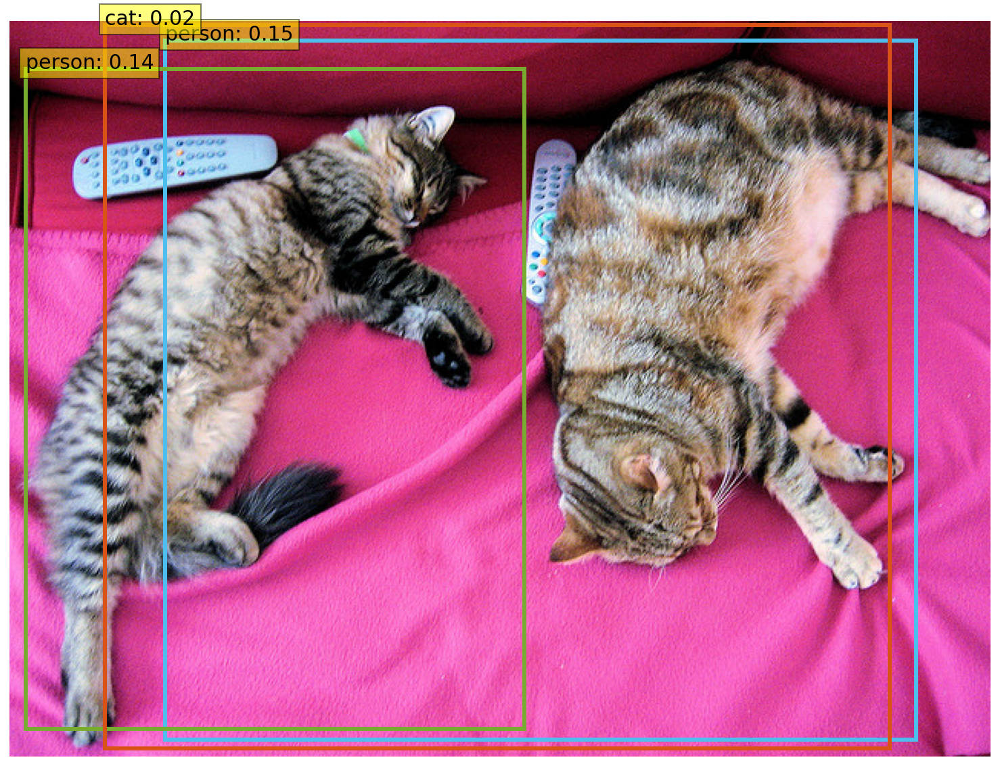

<Figure size 432x288 with 0 Axes>

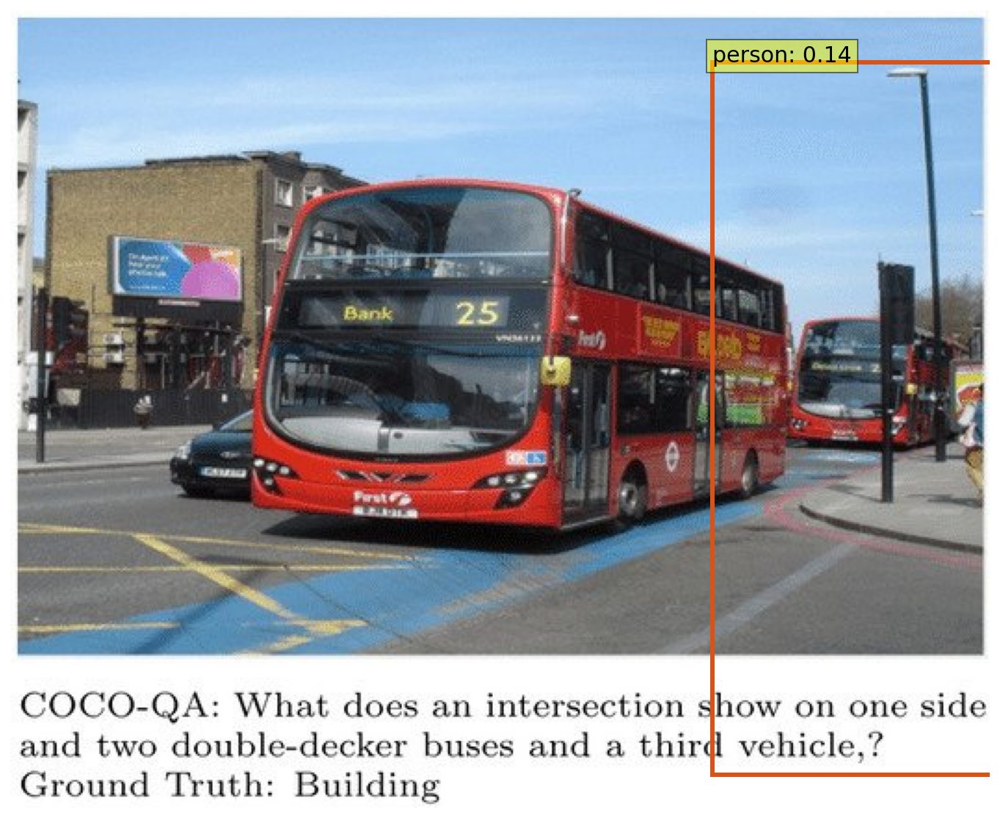

<Figure size 432x288 with 0 Axes>

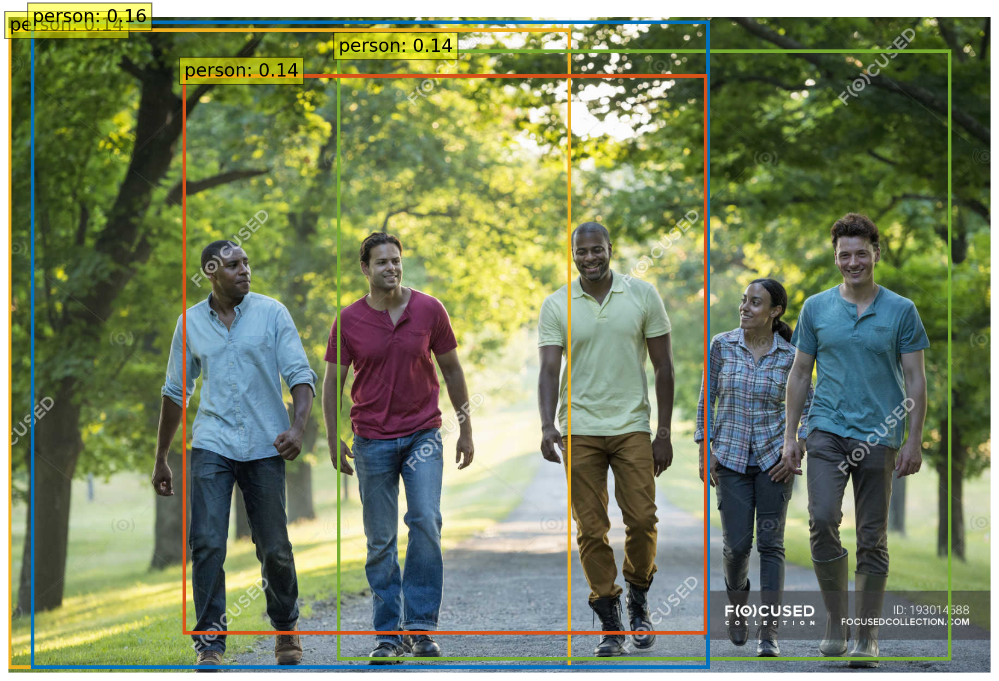

<Figure size 432x288 with 0 Axes>

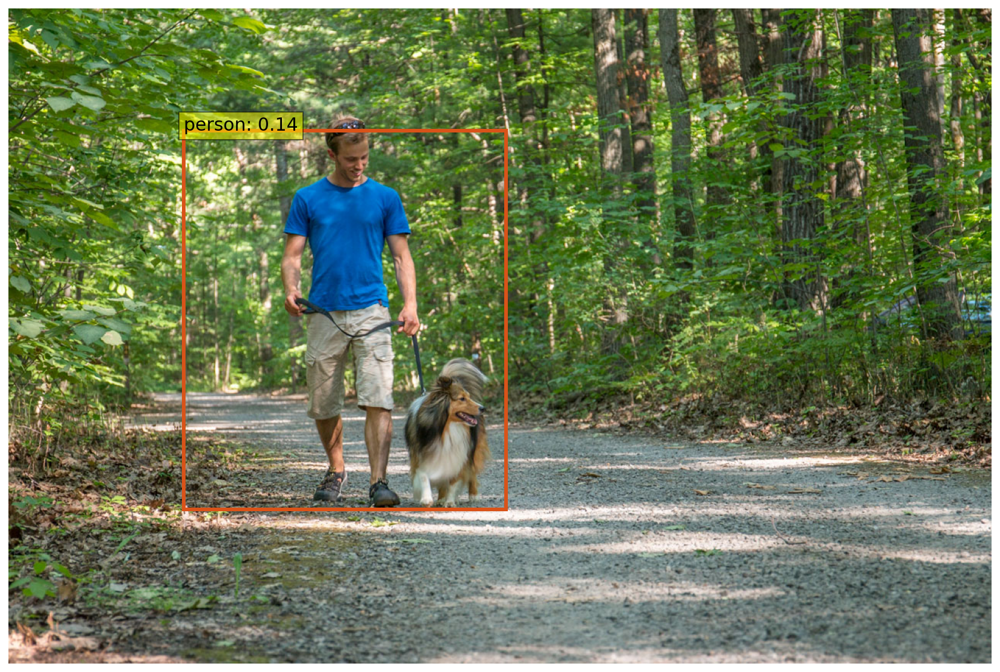

<Figure size 432x288 with 0 Axes>

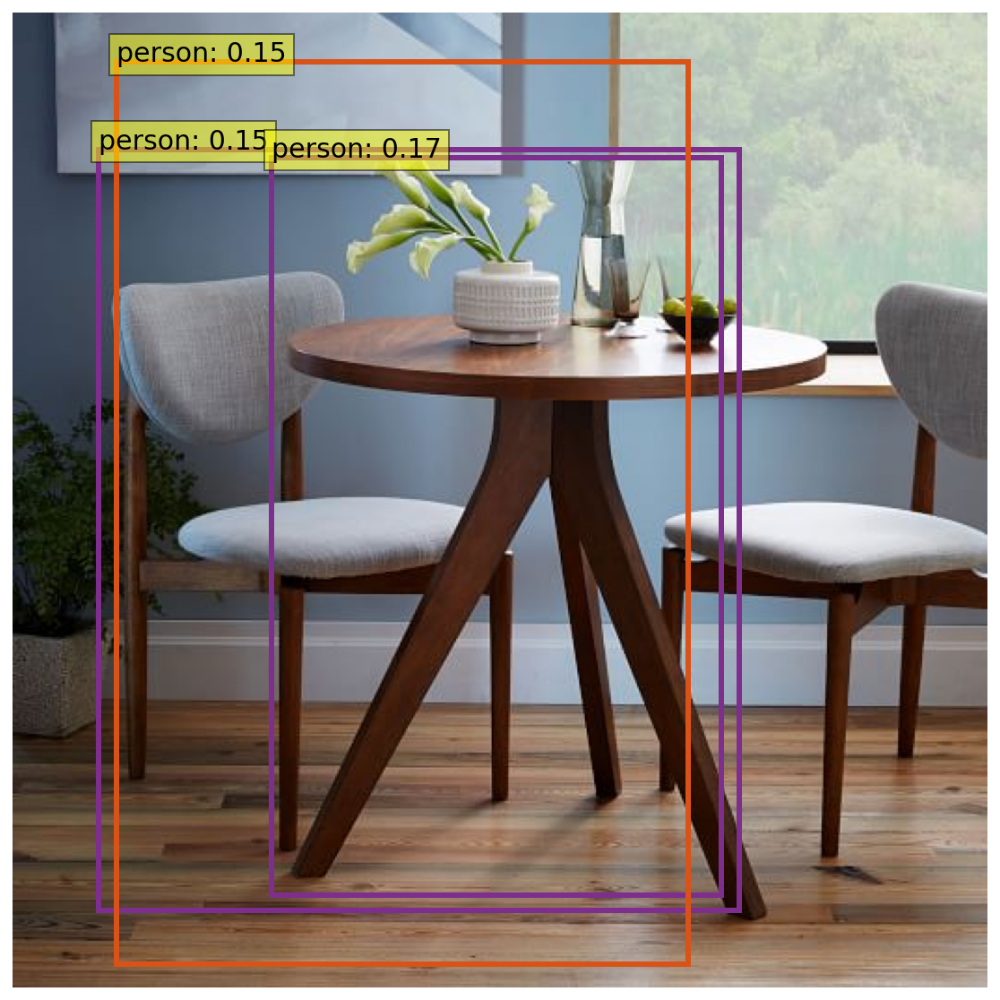

dog  detected! as a second prediction


<Figure size 432x288 with 0 Axes>

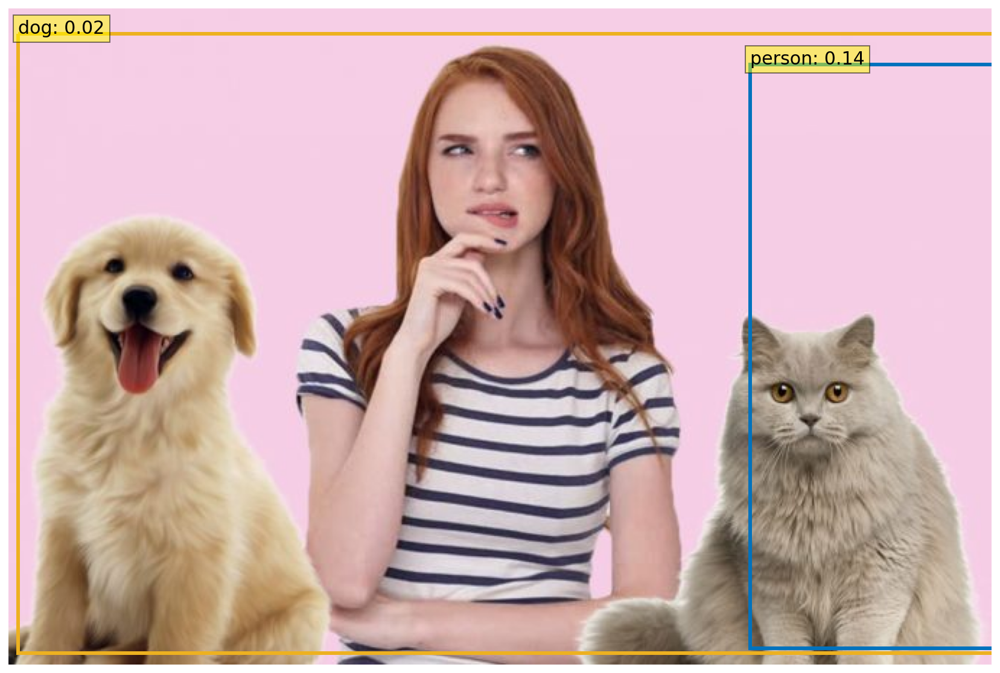

In [68]:
modeltrained = "minicoco_ep30"
count = 0

for url in urls:
    count+=1
    try:
        im = Image.open(requests.get(url, stream=True).raw)
    except:
        im = Image.open(url)
    scores, boxes = detect(im, detr, transform,-0.12)

    plot_results(im, scores, boxes, second=True, th1=0.14, th2=0.014, filename='images/'+modeltrained+'_'+str(count)+'.png')

In [60]:
# plot_results(im, scores, boxes, True, -0.01)